# Compress τ dependence

In [1]:
using Revise
using Plots
using LinearAlgebra
using SparseIR
import SparseIR: valueim

newaxis = [CartesianIndex()]

┌ Info: Precompiling Plots [91a5bcdd-55d7-5caf-9e0b-520d859cae80]
└ @ Base loading.jl:1423
┌ Info: Precompiling SparseIR [4fe2279e-80f0-4adb-8463-ee114ff56b7d]
└ @ Base loading.jl:1423


1-element Vector{CartesianIndex{0}}:
 CartesianIndex()

In [2]:
BLAS.set_num_threads(16)

In [3]:
println(Threads.nthreads())

1


In [4]:
using ITensors

println(ITensors.blas_get_num_threads())

16


┌ Info: Precompiling ITensors [9136182c-28ba-11e9-034c-db9fb085ebd5]
└ @ Base loading.jl:1423


In [19]:
beta = 1000.0
wmax = 10.0

basis = SparseIR.FiniteTempBasis(Fermionic(), beta, wmax, 1e-10)
smpl = SparseIR.MatsubaraSampling(basis)
;

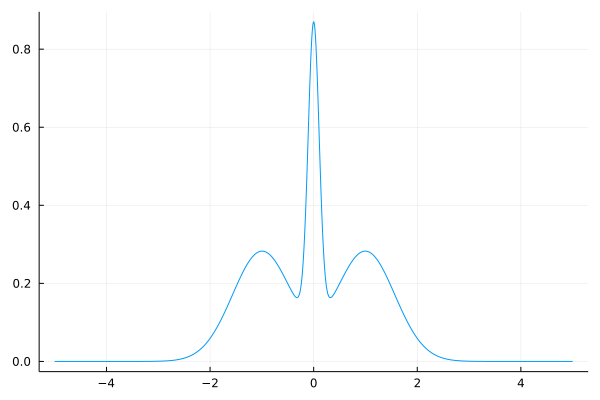

In [20]:
# Three Gaussian peaks (normalized to 1)
gaussian(x, mu, sigma) = exp(-((x-mu)/sigma)^2)/(sqrt(π)*sigma)

rho(omega) = 0.2*gaussian(omega, 0.0, 0.15) + 
    0.4*gaussian(omega, 1.0, 0.8) + 0.4*gaussian(omega, -1.0, 0.8)

omegas = LinRange(-5, 5, 1000)
plot(omegas, rho.(omegas), label="")

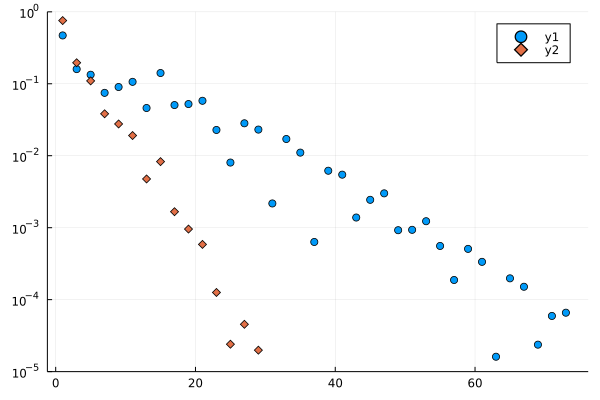

In [21]:
rhol = [overlap(basis.v[l], rho) for l in 1:length(basis)]
gl = - basis.s .* rhol

plot([abs.(rhol), abs.(gl)], yaxis=:log, ylims=(1e-5,1), marker=[:circle :diamond], line=nothing)

In [33]:
N = 14
half_N = N ÷ 2
ntau = 2^N
half_tau = 2^(N-1)
ntau

16384

In [34]:
taus = collect(LinRange(0, beta, ntau+1)[1:end-1])
gtau = evaluate(TauSampling(basis, taus), gl)
;

In [35]:
plot(taus, real.(gtau), marker=:x)

In [36]:
tensor = reshape(gtau, repeat([2,], N)...)
;

In [37]:
u, s, vt = svd(reshape(tensor, :, 2^half_N))
;

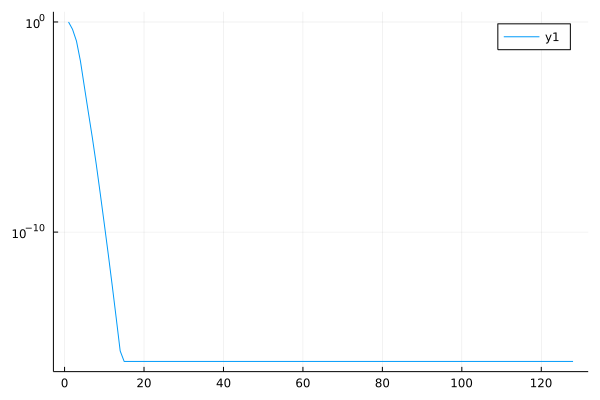

In [38]:
plot(s./s[1], yaxis=:log)

In [39]:
sites = siteinds(2, N)

14-element Vector{Index{Int64}}:
 (dim=2|id=215|"Site,n=1")
 (dim=2|id=184|"Site,n=2")
 (dim=2|id=84|"Site,n=3")
 (dim=2|id=83|"Site,n=4")
 (dim=2|id=559|"Site,n=5")
 (dim=2|id=757|"Site,n=6")
 (dim=2|id=359|"Site,n=7")
 (dim=2|id=425|"Site,n=8")
 (dim=2|id=611|"Site,n=9")
 (dim=2|id=566|"Site,n=10")
 (dim=2|id=662|"Site,n=11")
 (dim=2|id=290|"Site,n=12")
 (dim=2|id=85|"Site,n=13")
 (dim=2|id=284|"Site,n=14")

In [40]:
cutoff = 1E-20
maxdim = 20
M = MPS(tensor, sites; cutoff=cutoff, maxdim=maxdim)

Contraction resulted in ITensor with 14 indices, which is greater than or equal to the ITensor order warning threshold 14. You can modify the threshold with macros like `@set_warn_order N`, `@reset_warn_order`, and `@disable_warn_order` or functions like `ITensors.set_warn_order(N::Int)`, `ITensors.reset_warn_order()`, and `ITensors.disable_warn_order()`.

Stacktrace:
  [1] _contract(A::ITensor, B::ITensor)
    @ ITensors /sharehome/shinaoka/.julia/packages/ITensors/PisGD/src/itensor.jl:1884
  [2] contract(A::ITensor, B::ITensor)
    @ ITensors /sharehome/shinaoka/.julia/packages/ITensors/PisGD/src/itensor.jl:1980
  [3] *(A::ITensor, B::ITensor)
    @ ITensors /sharehome/shinaoka/.julia/packages/ITensors/PisGD/src/itensor.jl:1967
  [4] svd(A::ITensor, Linds::Vector{Index{Int64}}; kwargs::Base.Pairs{Symbol, Any, NTuple{5, Symbol}, NamedTuple{(:cutoff, :maxdim, :tags, :ortho, :alg), Tuple{Float64, Int64, String, String, String}}})
    @ ITensors /sharehome/shinaoka/.julia/packages/ITenso

MPS
[1] ((dim=2|id=215|"Site,n=1"), (dim=2|id=799|"Link,n=1"))
[2] ((dim=2|id=799|"Link,n=1"), (dim=2|id=184|"Site,n=2"), (dim=4|id=172|"Link,n=2"))
[3] ((dim=4|id=172|"Link,n=2"), (dim=2|id=84|"Site,n=3"), (dim=6|id=289|"Link,n=3"))
[4] ((dim=6|id=289|"Link,n=3"), (dim=2|id=83|"Site,n=4"), (dim=8|id=420|"Link,n=4"))
[5] ((dim=8|id=420|"Link,n=4"), (dim=2|id=559|"Site,n=5"), (dim=9|id=391|"Link,n=5"))
[6] ((dim=9|id=391|"Link,n=5"), (dim=2|id=757|"Site,n=6"), (dim=9|id=598|"Link,n=6"))
[7] ((dim=9|id=598|"Link,n=6"), (dim=2|id=359|"Site,n=7"), (dim=10|id=539|"Link,n=7"))
[8] ((dim=10|id=539|"Link,n=7"), (dim=2|id=425|"Site,n=8"), (dim=10|id=84|"Link,n=8"))
[9] ((dim=10|id=84|"Link,n=8"), (dim=2|id=611|"Site,n=9"), (dim=10|id=948|"Link,n=9"))
[10] ((dim=10|id=948|"Link,n=9"), (dim=2|id=566|"Site,n=10"), (dim=10|id=100|"Link,n=10"))
[11] ((dim=10|id=100|"Link,n=10"), (dim=2|id=662|"Site,n=11"), (dim=8|id=634|"Link,n=11"))
[12] ((dim=8|id=634|"Link,n=11"), (dim=2|id=290|"Site,n=12"), (dim

In [41]:
tensor_reconst = Array(reduce(*, M), sites...)
;

Contraction resulted in ITensor with 14 indices, which is greater than or equal to the ITensor order warning threshold 14. You can modify the threshold with macros like `@set_warn_order N`, `@reset_warn_order`, and `@disable_warn_order` or functions like `ITensors.set_warn_order(N::Int)`, `ITensors.reset_warn_order()`, and `ITensors.disable_warn_order()`.

Stacktrace:
  [1] _contract(A::ITensor, B::ITensor)
    @ ITensors /sharehome/shinaoka/.julia/packages/ITensors/PisGD/src/itensor.jl:1884
  [2] contract(A::ITensor, B::ITensor)
    @ ITensors /sharehome/shinaoka/.julia/packages/ITensors/PisGD/src/itensor.jl:1980
  [3] *
    @ /sharehome/shinaoka/.julia/packages/ITensors/PisGD/src/itensor.jl:1967 [inlined]
  [4] BottomRF
    @ ./reduce.jl:81 [inlined]
  [5] _foldl_impl
    @ ./reduce.jl:62 [inlined]
  [6] foldl_impl
    @ ./reduce.jl:48 [inlined]
  [7] mapfoldl_impl(f::typeof(identity), op::typeof(*), nt::Base._InitialValue, itr::MPS)
    @ Base ./reduce.jl:44
  [8] mapfoldl(f::Functi

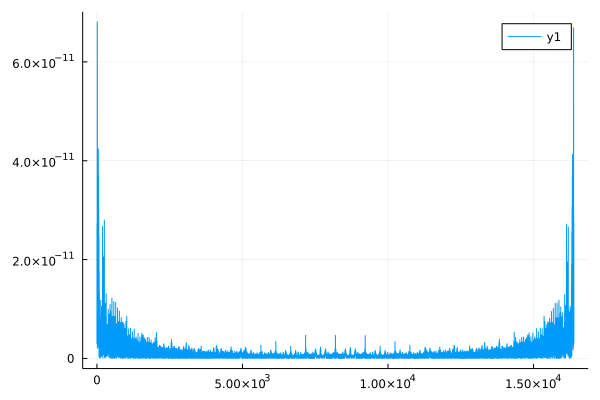

In [42]:
plot(abs.(vec(tensor_reconst) .- vec(tensor)))

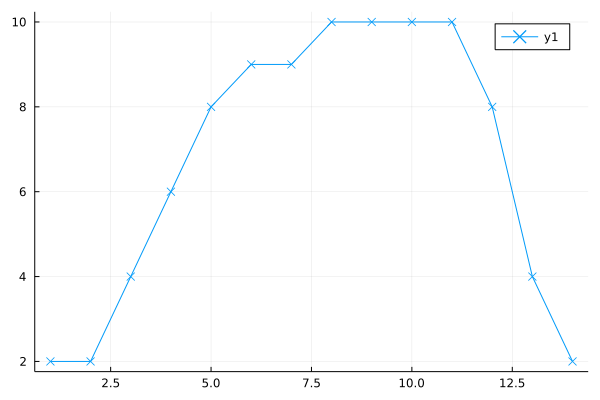

In [43]:
bonddims = collect(size(m)[1] for m in M)
plot(bonddims, marker=:x)